# Objective of the project

### The aim of our project is to build a player clustering model to group players with similar attacking capabilities together. The grouped players will help the clubs to identify potential targets in the summer and winter transfer window which presents a business opportunity for football clubs.

# Result of the model:

# Identified Erling Halaand as the best player for the football clubs to target based on his attacking features

## Importing libraries for data analysis and manipulation

### We import all the necessary libraries for the manipulation and analysis of data.

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import re
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
import warnings
warnings.filterwarnings('ignore')

# Loading Dataset

### We load the dataset using the .csv reading capabilities of pandas library. The dataset is obtained from Kaggle and contains information about all the players which are there in FIFA 22.

In [5]:
plr_info=pd.read_csv('D:\\Learning Python\\Machine Learning\\ML FIFA Project\\FIFA22.csv')
plr_info.head()

,sofifa_id,player_url,short_name,long_name,player_positions,overall,potential,value_eur,wage_eur,age,...,lcb,cb,rcb,rb,gk,player_face_url,club_logo_url,club_flag_url,nation_logo_url,nation_flag_url
0,158023,https://sofifa.com/player/158023/lionel-messi/...,L. Messi,Lionel Andrés Messi Cuccittini,"RW, ST, CF",93,93,78000000.0,320000.0,34,...,50+3,50+3,50+3,61+3,19+3,https://cdn.sofifa.net/players/158/023/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,https://cdn.sofifa.net/teams/1369/60.png,https://cdn.sofifa.net/flags/ar.png
1,188545,https://sofifa.com/player/188545/robert-lewand...,R. Lewandowski,Robert Lewandowski,ST,92,92,119500000.0,270000.0,32,...,60+3,60+3,60+3,61+3,19+3,https://cdn.sofifa.net/players/188/545/22_120.png,https://cdn.sofifa.net/teams/21/60.png,https://cdn.sofifa.net/flags/de.png,https://cdn.sofifa.net/teams/1353/60.png,https://cdn.sofifa.net/flags/pl.png
2,20801,https://sofifa.com/player/20801/c-ronaldo-dos-...,Cristiano Ronaldo,Cristiano Ronaldo dos Santos Aveiro,"ST, LW",91,91,45000000.0,270000.0,36,...,53+3,53+3,53+3,60+3,20+3,https://cdn.sofifa.net/players/020/801/22_120.png,https://cdn.sofifa.net/teams/11/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1354/60.png,https://cdn.sofifa.net/flags/pt.png
3,190871,https://sofifa.com/player/190871/neymar-da-sil...,Neymar Jr,Neymar da Silva Santos Júnior,"LW, CAM",91,91,129000000.0,270000.0,29,...,50+3,50+3,50+3,62+3,20+3,https://cdn.sofifa.net/players/190/871/22_120.png,https://cdn.sofifa.net/teams/73/60.png,https://cdn.sofifa.net/flags/fr.png,NaN,https://cdn.sofifa.net/flags/br.png
4,192985,https://sofifa.com/player/192985/kevin-de-bruy...,K. De Bruyne,Kevin De Bruyne,"CM, CAM",91,91,125500000.0,350000.0,30,...,69+3,69+3,69+3,75+3,21+3,https://cdn.sofifa.net/players/192/985/22_120.png,https://cdn.sofifa.net/teams/10/60.png,https://cdn.sofifa.net/flags/gb-eng.png,https://cdn.sofifa.net/teams/1325/60.png,https://cdn.sofifa.net/flags/be.png


# Listing All Columns In Dataset

### We take a look at all the features/columns available in our dataset. Later on we will filter out these features to consider only a few columns which will be considered for building the final model.

In [7]:
list(plr_info.columns) 

['sofifa_id',
 'player_url',
 'short_name',
 'long_name',
 'player_positions',
 'overall',
 'potential',
 'value_eur',
 'wage_eur',
 'age',
 'dob',
 'height_cm',
 'weight_kg',
 'club_team_id',
 'club_name',
 'league_name',
 'league_level',
 'club_position',
 'club_jersey_number',
 'club_loaned_from',
 'club_joined',
 'club_contract_valid_until',
 'nationality_id',
 'nationality_name',
 'nation_team_id',
 'nation_position',
 'nation_jersey_number',
 'preferred_foot',
 'weak_foot',
 'skill_moves',
 'international_reputation',
 'work_rate',
 'body_type',
 'real_face',
 'release_clause_eur',
 'player_tags',
 'player_traits',
 'pace',
 'shooting',
 'passing',
 'dribbling',
 'defending',
 'physic',
 'attacking_crossing',
 'attacking_finishing',
 'attacking_heading_accuracy',
 'attacking_short_passing',
 'attacking_volleys',
 'skill_dribbling',
 'skill_curve',
 'skill_fk_accuracy',
 'skill_long_passing',
 'skill_ball_control',
 'movement_acceleration',
 'movement_sprint_speed',
 'movement_agi

# Understanding Basic Dataset Structure

### We use the .info feature of the dataframe to understand the basic structure of the data that we will be working with. We observe that there are 110 columns in our dataset with 16 columns containing float values, 44 columns containing integral values and 50 columns containing string/object values. 

In [9]:
plr_info.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 19239 entries, 0 to 19238
Columns: 110 entries, sofifa_id to nation_flag_url
dtypes: float64(16), int64(44), object(50)
memory usage: 16.1+ MB


# Listing Unwanted Columns In Dataset and Deleting them.

### We create a list of unwanted columns in our dataset. We delete those features from our dataset as they are string objects which will not affect the modeling aspect as they don't carry any information about the attacking capabilities of the players.

In [11]:
unwanted_cols_1=['sofifa_id','player_url','long_name','player_positions','dob','club_team_id','club_loaned_from',
               'nationality_id','nation_team_id','real_face','player_face_url','club_logo_url','club_flag_url',
               'nation_logo_url','nation_flag_url','nation_jersey_number'] 

In [13]:
plr_info_1=plr_info.drop(unwanted_cols_1,axis=1)          # Removing unwanted columns.
plr_info_1.dtypes.value_counts()                          # Checking datatypes of all remaining columns.

int64      42
object     39
float64    13
Name: count, dtype: int64

### We take a look at the basic subset of our entire dataset

In [15]:
plr_info_1.head()         # Looking at basic structure of the dataset.

,short_name,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_name,league_name,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,L. Messi,93,93,78000000.0,320000.0,34,170,72,Paris Saint-Germain,French Ligue 1,...,64+3,64+3,64+3,66+3,61+3,50+3,50+3,50+3,61+3,19+3
1,R. Lewandowski,92,92,119500000.0,270000.0,32,185,81,FC Bayern München,German 1. Bundesliga,...,66+3,66+3,66+3,64+3,61+3,60+3,60+3,60+3,61+3,19+3
2,Cristiano Ronaldo,91,91,45000000.0,270000.0,36,187,83,Manchester United,English Premier League,...,59+3,59+3,59+3,63+3,60+3,53+3,53+3,53+3,60+3,20+3
3,Neymar Jr,91,91,129000000.0,270000.0,29,175,68,Paris Saint-Germain,French Ligue 1,...,63+3,63+3,63+3,67+3,62+3,50+3,50+3,50+3,62+3,20+3
4,K. De Bruyne,91,91,125500000.0,350000.0,30,181,70,Manchester City,English Premier League,...,80+3,80+3,80+3,79+3,75+3,69+3,69+3,69+3,75+3,21+3


# Creating a List Holding Different Positions

### We create a list of different positions which we will be considering while building the model. We create a final list having 27 positions.

In [17]:
pos=['ls','st','rs','lw','lf','cf','rf','rw','lam','cam','ram','lm','lcm','cm','rcm','rm','lwb','ldm','cdm','rdm','rwb','lb',
     'lcb','cb','rcb','rb','gk']
len(pos)

27

# Displaying Numeric Columns

### We list down all the numerical columns present in our dataset which can be utilized directly i.e. we do not need to do further transformation with them which will be required with categorical/string variables when building our model.

In [19]:
plr_info_1.select_dtypes(include=['int64','float64']).columns

Index(['overall', 'potential', 'value_eur', 'wage_eur', 'age', 'height_cm',
       'weight_kg', 'league_level', 'club_jersey_number',
       'club_contract_valid_until', 'weak_foot', 'skill_moves',
       'international_reputation', 'release_clause_eur', 'pace', 'shooting',
       'passing', 'dribbling', 'defending', 'physic', 'attacking_crossing',
       'attacking_finishing', 'attacking_heading_accuracy',
       'attacking_short_passing', 'attacking_volleys', 'skill_dribbling',
       'skill_curve', 'skill_fk_accuracy', 'skill_long_passing',
       'skill_ball_control', 'movement_acceleration', 'movement_sprint_speed',
       'movement_agility', 'movement_reactions', 'movement_balance',
       'power_shot_power', 'power_jumping', 'power_stamina', 'power_strength',
       'power_long_shots', 'mentality_aggression', 'mentality_interceptions',
       'mentality_positioning', 'mentality_vision', 'mentality_penalties',
       'mentality_composure', 'defending_marking_awareness',
       'd

# Displaying Object Columns

### Here, we list down all the columns which are of object type. We need to convert them into quantitative values and drop certain features later in our analysis as the model only works with quantitative features/column.

In [21]:
plr_info_1.select_dtypes(exclude=['int64','float64']).columns

Index(['short_name', 'club_name', 'league_name', 'club_position',
       'club_joined', 'nationality_name', 'nation_position', 'preferred_foot',
       'work_rate', 'body_type', 'player_tags', 'player_traits', 'ls', 'st',
       'rs', 'lw', 'lf', 'cf', 'rf', 'rw', 'lam', 'cam', 'ram', 'lm', 'lcm',
       'cm', 'rcm', 'rm', 'lwb', 'ldm', 'cdm', 'rdm', 'rwb', 'lb', 'lcb', 'cb',
       'rcb', 'rb', 'gk'],
      dtype='object')

# Exploratory Data Analysis

### We perform exploratory data analysis to understand how different columns are distributed or related to the overall rating of the players.

# 1. Overall Rating of the Players
### a. Maximum number of players have their rating as 65.
### b. Also, the number of players with overall rating>75 sees a sharp dip.
### c. The overall rating of the player is normally distributed.

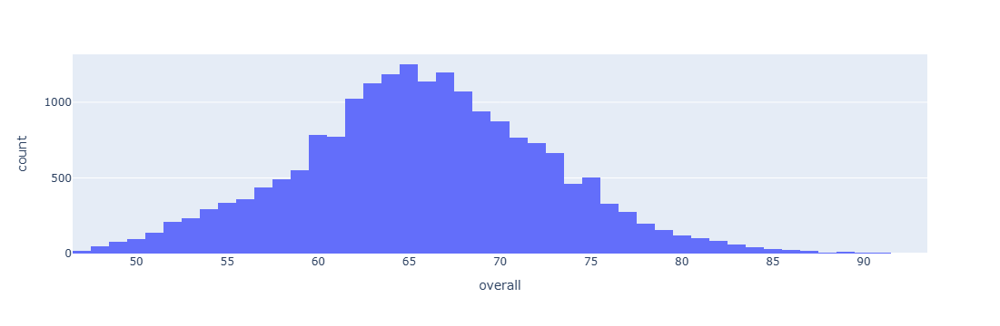

In [23]:
fig=px.histogram(plr_info_1,x='overall')
fig.show()

# 2. Age of the Payers
### a. The distribution of the age of players is positively skewed i.e. most of the players are under the age of 30. It is understandable as the fitness of the players get affected when they old.
### b. Maximum number of players are 21 years old.

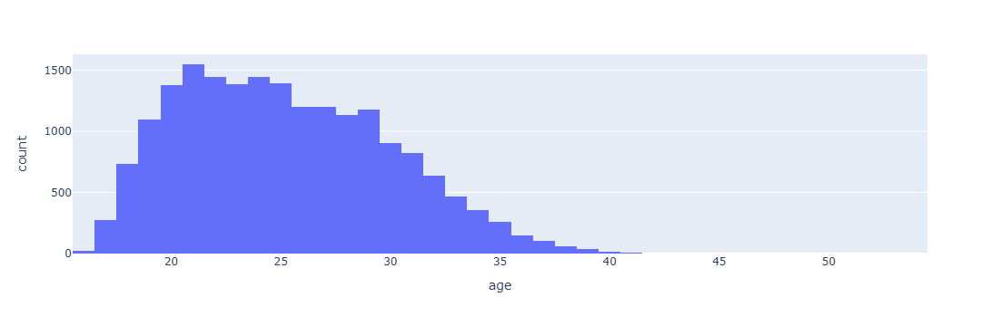

In [25]:
fig=px.histogram(plr_info_1,x='age')
fig.show()

# 3. Height of the Players
### a. The height of the player seems to be normally distributed with mean centred at 180 cm.
### b. Maximum number of players have their height as 180 cm.

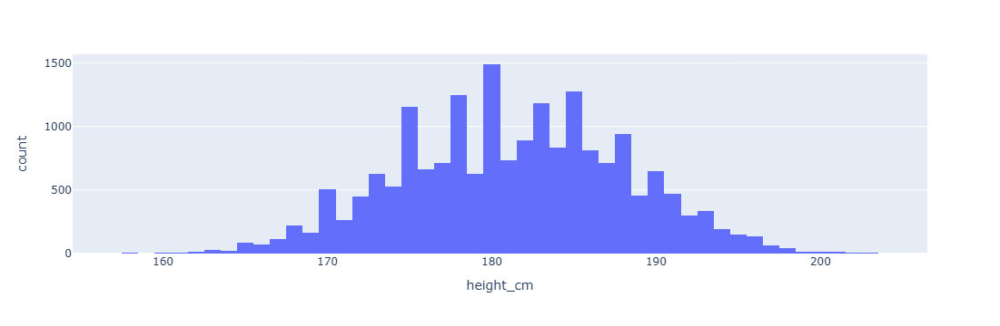

In [27]:
fig=px.histogram(plr_info_1,x='height_cm')
fig.show()

# 4. Top Categories

## 4.1. Most Valuable in Market

### a.  Looking at the current market evaluation trend we can observe that K. Mbappe is the highest valued player in the market followed by E. Halaand and H. Kane.

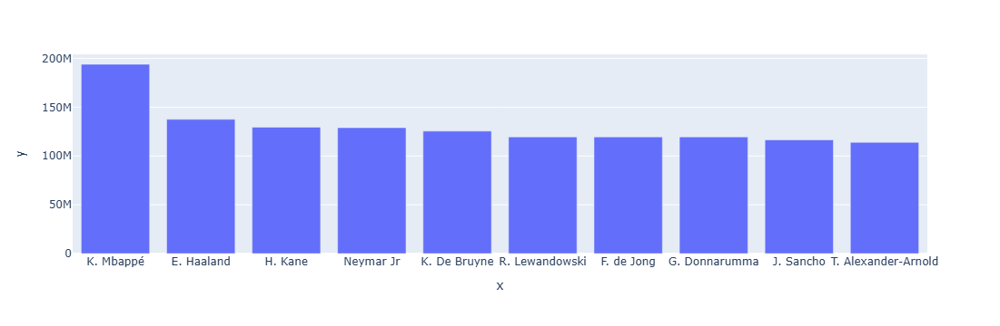

In [29]:
plr_mktprice=plr_info_1.sort_values(by='value_eur',ascending=False)
fig=px.bar(x=plr_mktprice[:10].short_name,y=plr_mktprice[0:10].value_eur)
fig.show()

## 4.2. Highest Wages

### a. Looking at the current player wages trend we can observe that K. De Bruyne earns the highest wages followed by K. Benzema and L. Messi.

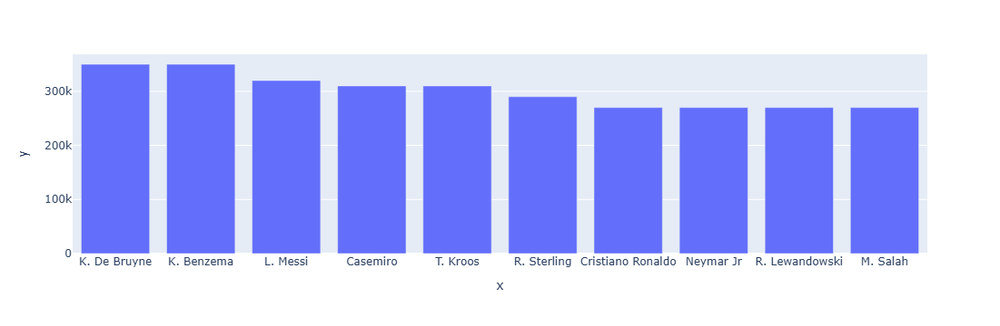

In [31]:
plr_wages=plr_info_1.sort_values(by='wage_eur',ascending=False)
fig=px.bar(x=plr_wages[:10].short_name,y=plr_wages[0:10].wage_eur)
fig.show()

## 4.3. Most Nationalities
### a. Majority of the players are from Europe. It is understandable as football is the most popular sport in Europe.

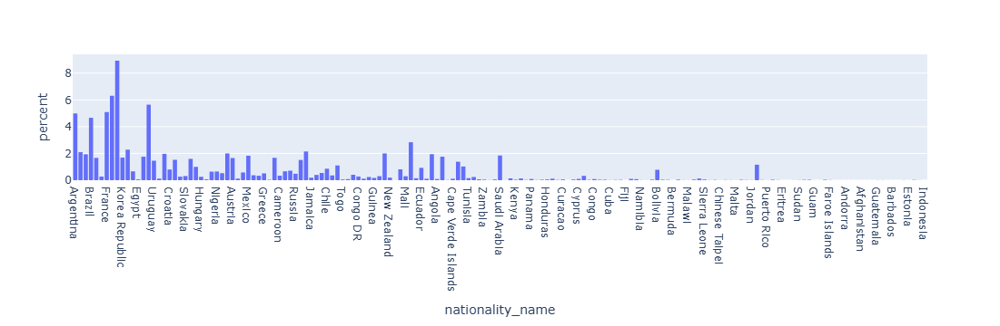

In [33]:
fig=px.histogram(plr_info_1,x='nationality_name',histnorm='percent')
fig.show()

## 5. Age vs Overall: We fit a regression plot to understand the relationship between player age and overall.
### a. The overall rating of the players increases with age.
### b. Experience builds up with time and hence their overall rating increases.

Text(0, 0.5, 'Player Overall')

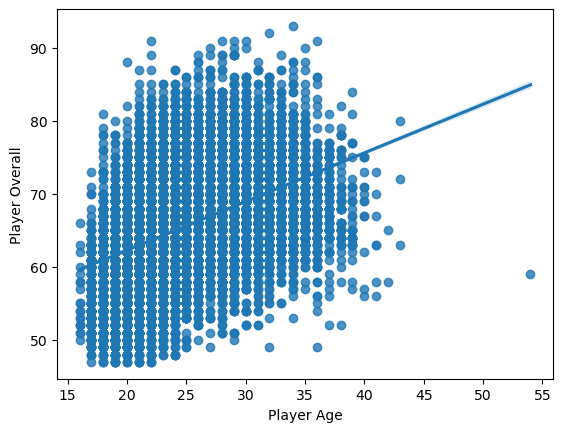

In [35]:
sns.regplot(x=plr_info_1.age,y=plr_info_1.overall)
plt.xlabel('Player Age')
plt.ylabel('Player Overall')

## 6. International Reputation of the Players: We consider this metric to understand the reputation of the players internationally.
### a. Only 8% of the players have their international reputation >1.

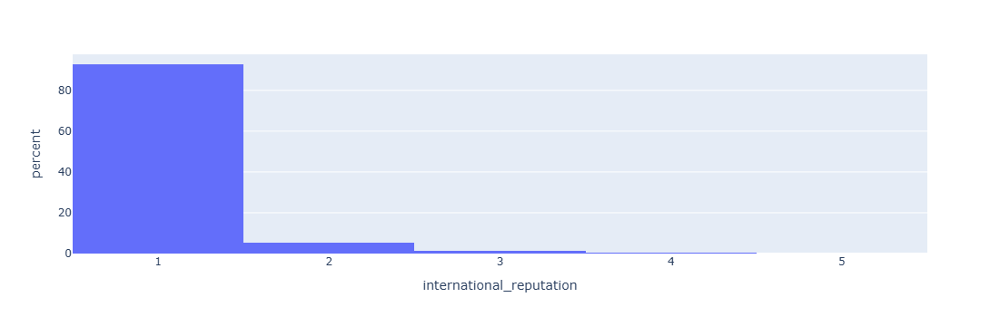

In [37]:
fig=px.histogram(plr_info_1,x='international_reputation',histnorm='percent')
fig.show()

## 7. Aggregation based on Feature

## 7.1. Preferred Foot: We consider the distribution of players wrt the preferred foot of the players.
### a. Most of the players are right footed.

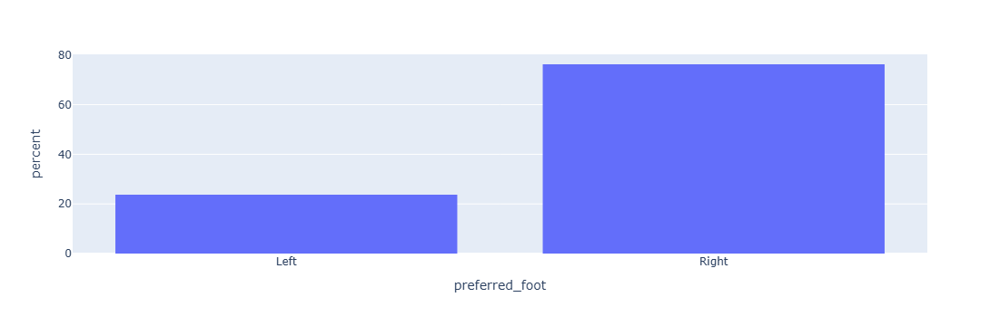

In [39]:
fig=px.histogram(plr_info_1,x='preferred_foot',histnorm='percent')
fig.show()

## 7.2. Work Rate: This is considered as an essential metric as it helps us to understand the effort put in by the players during the game.
### a. Medium Work Rate is seen amongst most players. It is understandable as high performance for 90 minutes of every game requires high conditioning which can burn out the player as well.
### b. Work rate keeps on switching between High and Medium as per the tempo of the game.

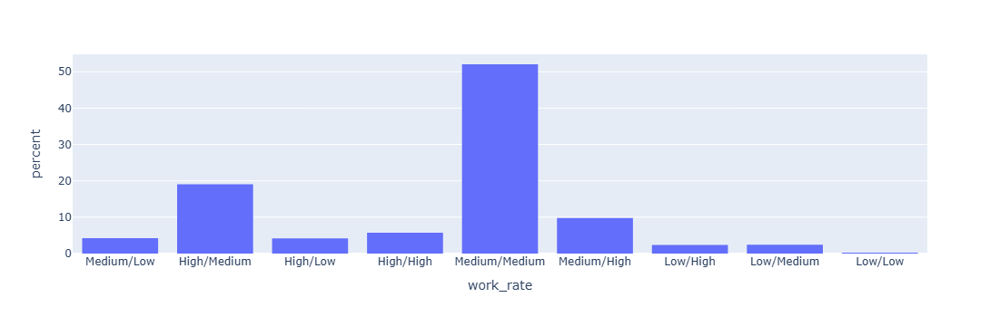

In [41]:
fig=px.histogram(plr_info_1,x='work_rate',histnorm='percent')
fig.show()

# Pair Plot: We create a pair plot to understand the relationship of different players with each other.

## Selected only those features which can give a holistic picture of the players.

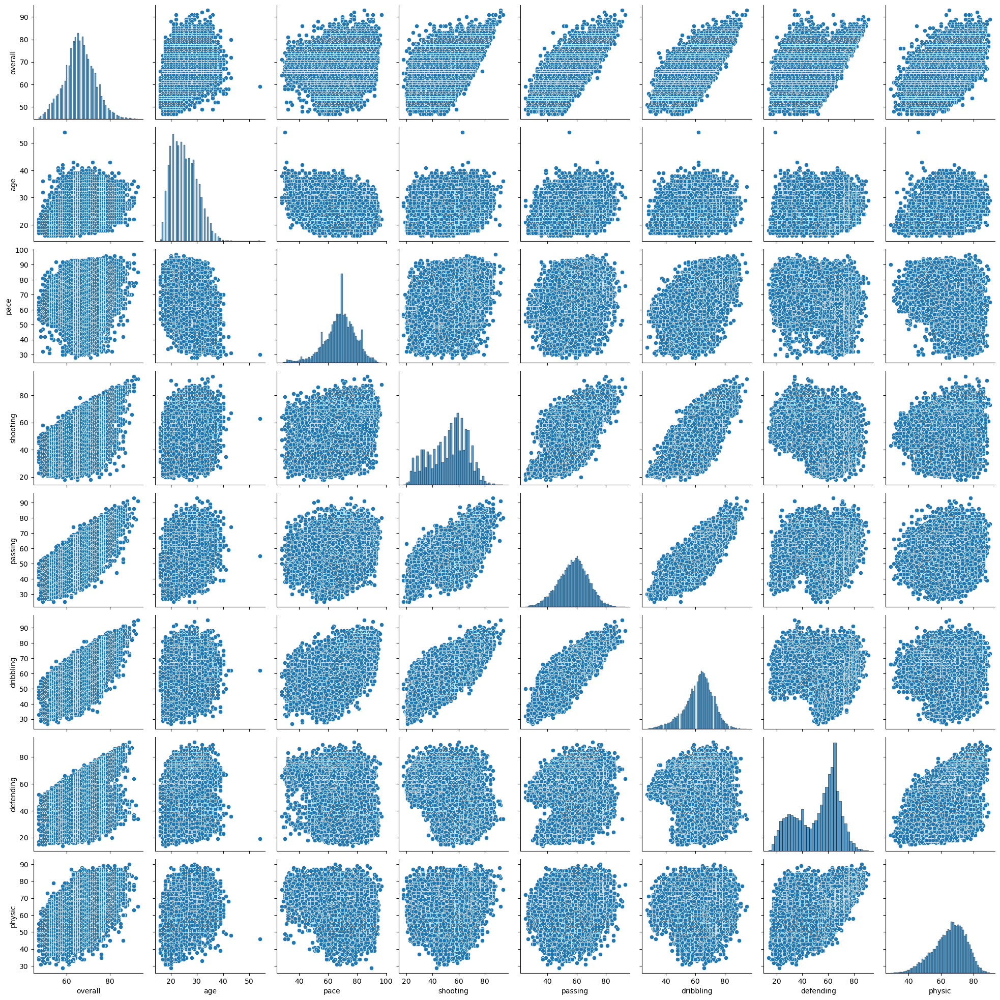

In [43]:
sns.pairplot(plr_info_1,vars=['overall','age','pace',
       'shooting','passing','dribbling','defending','physic']);

# Observations:

## 1. Distribution

### a. Normal Distribution: The overall, pace, passing, dribbling and physic are normally distributed i.e. they are centred around the average value.

### b. Positively Skewed: Age is positively skewed i.e. Mean age of the players is highest amongst the median and the mode.

### c. Negatively Skewed: Physical attribute represented by Physic is negatively skewed. It means that mean physic is smallest amongst the median and the mode.

## 2. The overall rating of the player is positively corelated with passing, dribbling, shooting and physic. It is understandable as these features gives a holistic picture of a players capabilities.

## 3. Shooting is positively corelated with passing and dribbling. It makes sense as all these features are related to ball control and the player's ability on the ball.

# Feature Engineering: We perform the feature engineering task to clean our data such that it can be utilized to create the model.

#### 1. Splitting the position rating column due to '+' and '-'. 
#### 2. Taking first component only after splitting.
#### 3. Converting split values into 'Int64' value.

In [45]:
for p in pos:
    plr_info_1[p] = plr_info_1[p].apply(lambda x : int(re.split('[+ -]', x)[0]))

In [47]:
plr_info_1.dtypes.value_counts()     

int64      69
float64    13
object     12
Name: count, dtype: int64

## Collecting Non-Numeric Columns: Here, we check the remaining object/string type columns present in our dataset. We need to remove these columns from our analysis as they do not carry attacking information.

In [49]:
obj=plr_info_1.select_dtypes(exclude=['int64','float64']).columns   
plr_info_1[obj].head()

,short_name,club_name,league_name,club_position,club_joined,nationality_name,nation_position,preferred_foot,work_rate,body_type,player_tags,player_traits
0,L. Messi,Paris Saint-Germain,French Ligue 1,RW,2021-08-10,Argentina,RW,Left,Medium/Low,Unique,"#Dribbler, #Distance Shooter, #FK Specialist, ...","Finesse Shot, Long Shot Taker (AI), Playmaker ..."
1,R. Lewandowski,FC Bayern München,German 1. Bundesliga,ST,2014-07-01,Poland,RS,Right,High/Medium,Unique,"#Aerial Threat, #Distance Shooter, #Clinical F...","Solid Player, Finesse Shot, Outside Foot Shot,..."
2,Cristiano Ronaldo,Manchester United,English Premier League,ST,2021-08-27,Portugal,ST,Right,High/Low,Unique,"#Aerial Threat, #Dribbler, #Distance Shooter, ...","Power Free-Kick, Flair, Long Shot Taker (AI), ..."
3,Neymar Jr,Paris Saint-Germain,French Ligue 1,LW,2017-08-03,Brazil,NaN,Right,High/Medium,Unique,"#Speedster, #Dribbler, #Playmaker, #FK Special...","Injury Prone, Flair, Speed Dribbler (AI), Play..."
4,K. De Bruyne,Manchester City,English Premier League,RCM,2015-08-30,Belgium,RCM,Right,High/High,Unique,"#Dribbler, #Playmaker, #Engine, #Distance Shoo...","Injury Prone, Leadership, Early Crosser, Long ..."


# Checking Missing Values: We take a look at the missing values present in our dataset and see that there are 21 columns with missing values present in them. We need to fill them accordingly while building our final model.

In [51]:
plr_info_1.isna().sum().sort_values(ascending=False)[0:21]          

nation_position              18480
player_tags                  17798
goalkeeping_speed            17107
player_traits                 9841
pace                          2132
shooting                      2132
dribbling                     2132
defending                     2132
physic                        2132
passing                       2132
release_clause_eur            1176
club_joined                   1163
value_eur                       74
league_level                    61
club_position                   61
league_name                     61
club_contract_valid_until       61
club_name                       61
wage_eur                        61
club_jersey_number              61
lf                               0
dtype: int64

# Removing Unwanted Columns for Further Analysis: We further remove columns which we believe are unnecessary for our analysis in the step given below.

In [53]:
unwanted_cols_2=['club_name','league_name','club_joined','nationality_name','nation_position','player_tags','player_traits',
                 'goalkeeping_speed','club_contract_valid_until','club_jersey_number','league_level']
plr_info_2=plr_info_1.drop(unwanted_cols_2,axis=1)
plr_info_2.dtypes.value_counts()

int64      69
float64     9
object      5
Name: count, dtype: int64

# Again Checking Null Values: We again take a look at the missing values remaining in our dataset and observe that the number of columns with missing values decreased quite a lot on removing the string/object type columns from our dataset.

In [55]:
plr_info_2.isna().sum().sort_values(ascending=False)[0:12]     

pace                  2132
physic                2132
defending             2132
dribbling             2132
passing               2132
shooting              2132
release_clause_eur    1176
value_eur               74
wage_eur                61
club_position           61
short_name               0
rw                       0
dtype: int64

# Filling Missing Values

### First, we fill numeric columns of our dataset. We consider filling the missing values present in the numeric columns of our dataset by median values as it does not get affected by the outliers present in our dataset.
Numeric Columns- ['shooting','passing','dribbling','defending','physic','pace','release_clause_eur','value_eur','wage_eur']  

In [57]:
def num_fill(df,feature):
    for i in range(len(df)):
        if (df[feature].isna()[i]):
            ovr=df.iloc[i,:]['overall']
            val=df[(df['overall']==ovr)][feature].median()       # Filling Missing values with median values considering overall.
            df[feature].iloc[i]=val
            
    return (df)

In [59]:
num_fill(plr_info_2,'shooting')
num_fill(plr_info_2,'passing')
num_fill(plr_info_2,'dribbling')
num_fill(plr_info_2,'defending')
num_fill(plr_info_2,'physic')
num_fill(plr_info_2,'pace')
num_fill(plr_info_2,'release_clause_eur')
num_fill(plr_info_2,'value_eur')
num_fill(plr_info_2,'wage_eur')

,short_name,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_position,preferred_foot,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,L. Messi,93,93,78000000.0,320000.0,34,170,72,RW,Left,...,64,64,64,66,61,50,50,50,61,19
1,R. Lewandowski,92,92,119500000.0,270000.0,32,185,81,ST,Right,...,66,66,66,64,61,60,60,60,61,19
2,Cristiano Ronaldo,91,91,45000000.0,270000.0,36,187,83,ST,Right,...,59,59,59,63,60,53,53,53,60,20
3,Neymar Jr,91,91,129000000.0,270000.0,29,175,68,LW,Right,...,63,63,63,67,62,50,50,50,62,20
4,K. De Bruyne,91,91,125500000.0,350000.0,30,181,70,RCM,Right,...,80,80,80,79,75,69,69,69,75,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19234,Song Defu,47,52,70000.0,1000.0,22,180,64,SUB,Right,...,46,46,46,48,48,46,46,46,48,15
19235,C. Porter,47,59,110000.0,500.0,19,175,70,RES,Right,...,46,46,46,49,48,44,44,44,48,14
19236,N. Logue,47,55,100000.0,500.0,21,178,72,RES,Right,...,46,46,46,47,47,45,45,45,47,12
19237,L. Rudden,47,60,110000.0,500.0,19,173,66,RES,Right,...,29,29,29,33,32,26,26,26,32,15


## Now, we fill object/string type columns. We consider filling the column with mode value as it is the most common value among the object/string type column.
Object Columns- ['club_position']

In [61]:
def obj_fill(df,feature):
    for i in range(len(df)):
        if (df[feature].isna()[i]):
            ovr=df.iloc[i,:]['overall']
            val=df[(df['overall']==ovr)][feature].mode() # Filling Club Position with mode considering overall.
            df[feature].iloc[i]=val
            
    return (df)

In [63]:
obj_fill(plr_info_2,'club_position')

,short_name,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_position,preferred_foot,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,L. Messi,93,93,78000000.0,320000.0,34,170,72,RW,Left,...,64,64,64,66,61,50,50,50,61,19
1,R. Lewandowski,92,92,119500000.0,270000.0,32,185,81,ST,Right,...,66,66,66,64,61,60,60,60,61,19
2,Cristiano Ronaldo,91,91,45000000.0,270000.0,36,187,83,ST,Right,...,59,59,59,63,60,53,53,53,60,20
3,Neymar Jr,91,91,129000000.0,270000.0,29,175,68,LW,Right,...,63,63,63,67,62,50,50,50,62,20
4,K. De Bruyne,91,91,125500000.0,350000.0,30,181,70,RCM,Right,...,80,80,80,79,75,69,69,69,75,21
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19234,Song Defu,47,52,70000.0,1000.0,22,180,64,SUB,Right,...,46,46,46,48,48,46,46,46,48,15
19235,C. Porter,47,59,110000.0,500.0,19,175,70,RES,Right,...,46,46,46,49,48,44,44,44,48,14
19236,N. Logue,47,55,100000.0,500.0,21,178,72,RES,Right,...,46,46,46,47,47,45,45,45,47,12
19237,L. Rudden,47,60,110000.0,500.0,19,173,66,RES,Right,...,29,29,29,33,32,26,26,26,32,15


In [65]:
plr_info_2.isna().any().sum()       # Checking if there's any null value left.

0

# Attacking Players: We convert the positions of the players into string type as they will be essential for filtering the attacking players.

In [67]:
plr_info_2['club_position']=plr_info_2['club_position'].astype('str') # Converting club position into string type.

## a. Gathering all attacking players. Here, we gather all the players present in our dataset based on their attacking positions which we are interested in clustering around.

In [69]:
attackers=plr_info_2[(plr_info_2['club_position']=='ST') | (plr_info_2['club_position']=='CF') |
                     (plr_info_2['club_position']=='RF') | (plr_info_2['club_position']=='LF') |
                     (plr_info_2['club_position']=='RS') | (plr_info_2['club_position']=='LS') |
                     (plr_info_2['club_position']=='LW') | (plr_info_2['club_position']=='RW')]
attackers.head()        

,short_name,overall,potential,value_eur,wage_eur,age,height_cm,weight_kg,club_position,preferred_foot,...,ldm,cdm,rdm,rwb,lb,lcb,cb,rcb,rb,gk
0,L. Messi,93,93,78000000.0,320000.0,34,170,72,RW,Left,...,64,64,64,66,61,50,50,50,61,19
1,R. Lewandowski,92,92,119500000.0,270000.0,32,185,81,ST,Right,...,66,66,66,64,61,60,60,60,61,19
2,Cristiano Ronaldo,91,91,45000000.0,270000.0,36,187,83,ST,Right,...,59,59,59,63,60,53,53,53,60,20
3,Neymar Jr,91,91,129000000.0,270000.0,29,175,68,LW,Right,...,63,63,63,67,62,50,50,50,62,20
6,K. Mbappé,91,95,194000000.0,230000.0,22,182,73,ST,Right,...,63,63,63,67,63,54,54,54,63,18


## b. Gathering all attacking features: Here, we create a list to gather all the attacking features present in our dataset and filter it out accordingly as they will be essential in building the player clustering model.

In [71]:
attacking_features=['short_name','overall','potential','age','pace','shooting','passing','dribbling',
                   'attacking_crossing','attacking_finishing','attacking_heading_accuracy','attacking_short_passing',
                   'attacking_volleys','skill_dribbling','skill_curve','skill_fk_accuracy','skill_long_passing', 
                    'skill_ball_control','movement_acceleration','movement_sprint_speed','movement_agility',
                    'movement_reactions','movement_balance','power_shot_power','power_jumping','power_stamina', 
                    'power_strength','power_long_shots','value_eur']
attackers_1=attackers[attacking_features]
attackers_1.head()

,short_name,overall,potential,age,pace,shooting,passing,dribbling,attacking_crossing,attacking_finishing,...,movement_sprint_speed,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,value_eur
0,L. Messi,93,93,34,85.0,92.0,91.0,95.0,85,95,...,80,91,94,95,86,68,72,69,94,78000000.0
1,R. Lewandowski,92,92,32,78.0,92.0,79.0,86.0,71,95,...,79,77,93,82,90,85,76,86,87,119500000.0
2,Cristiano Ronaldo,91,91,36,87.0,94.0,80.0,88.0,87,95,...,88,86,94,74,94,95,77,77,93,45000000.0
3,Neymar Jr,91,91,29,91.0,83.0,86.0,94.0,85,83,...,89,96,89,84,80,64,81,53,81,129000000.0
6,K. Mbappé,91,95,22,97.0,88.0,80.0,92.0,78,93,...,97,92,93,83,86,78,88,77,82,194000000.0


## c. Listing all datatypes in attackers_1: Here, we take a look at the different datatypes present in our dataset.

In [73]:
attackers_1.dtypes.value_counts()   # Checking datatypes of columns in attackers dataframe.

int64      23
float64     5
object      1
Name: count, dtype: int64

# Building Model: Since, we want to cluster the players and we do not have any labels in our dataset so we use K-Means clustering algorithm (unsupervised learning) to cluster the similar players together based on their attacking capabilities.

In [75]:
from sklearn.cluster import KMeans        
from sklearn.preprocessing import StandardScaler

# Standardization: Here, we standardize the dataset since we want our features to have the same units.

In [77]:
scale=StandardScaler()              # Scaling the numeric features: (X-mu(X))/(std(X))
attack_num=scale.fit_transform(attackers_1.drop(['short_name'],axis=1))

In [79]:
attack_num

array([[ 3.8343608 ,  3.28130092,  1.63727813, ..., -0.03044027,
         3.52439365,  5.24452756],
       [ 3.67245716,  3.12217584,  1.18340879, ...,  1.25997202,
         2.7108892 ,  8.24879329],
       [ 3.51055351,  2.96305076,  2.09114748, ...,  0.57681257,
         3.40817873,  2.85559336],
       ...,
       [-2.4798813 , -2.92457713,  0.72953944, ...,  0.50090597,
        -1.47284799, -0.39408108],
       [-2.64178495, -3.08370221,  1.63727813, ...,  0.04546634,
        -1.24041814, -0.39878655],
       [-2.96559224, -1.33332635, -1.53980729, ..., -0.86541292,
        -3.44850166, -0.39190932]])

# Elbow Method to Determine Optimal K: Since, we do not know the optimal number of clusters beforehand so we determine the optimal number of groups/clusters by looking at the value of k wrt the squared distance between the points present within the same group. The value of k at which the shape of the graph changes gives the optimal value of clusters/groups that should be used for building the K-Means model

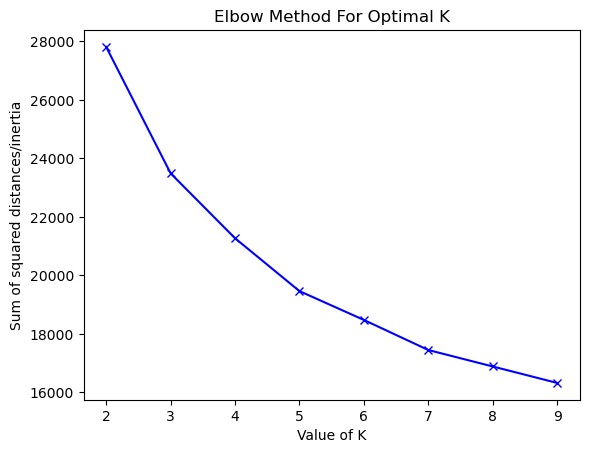

In [81]:
sse=[]
K=range(2,10)

for i in K:
    kmeans=KMeans(n_clusters=i)
    kmeans.fit(attack_num)
    sse.append(kmeans.inertia_)
    
plt.plot(K,sse,'bx-')
plt.xlabel('Value of K') 
plt.ylabel('Sum of squared distances/inertia') 
plt.title('Elbow Method For Optimal K')
plt.show()

In [83]:
att_model=KMeans(n_clusters=5)
att_cluster=att_model.fit_predict(attack_num)
att_cluster

array([0, 0, 0, ..., 4, 4, 4])

In [85]:
attackers_1['Cluster']=att_cluster
attackers_1.head()

,short_name,overall,potential,age,pace,shooting,passing,dribbling,attacking_crossing,attacking_finishing,...,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,value_eur,Cluster
0,L. Messi,93,93,34,85.0,92.0,91.0,95.0,85,95,...,91,94,95,86,68,72,69,94,78000000.0,0
1,R. Lewandowski,92,92,32,78.0,92.0,79.0,86.0,71,95,...,77,93,82,90,85,76,86,87,119500000.0,0
2,Cristiano Ronaldo,91,91,36,87.0,94.0,80.0,88.0,87,95,...,86,94,74,94,95,77,77,93,45000000.0,0
3,Neymar Jr,91,91,29,91.0,83.0,86.0,94.0,85,83,...,96,89,84,80,64,81,53,81,129000000.0,0
6,K. Mbappé,91,95,22,97.0,88.0,80.0,92.0,78,93,...,92,93,83,86,78,88,77,82,194000000.0,0


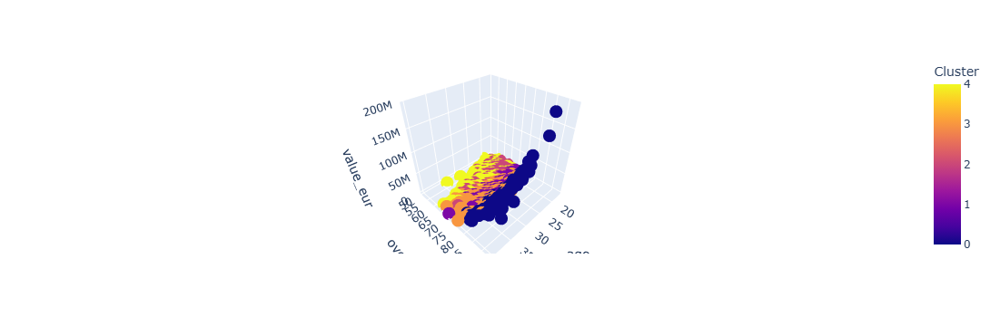

In [87]:
fig=px.scatter_3d(attackers_1,x='age',y='overall',z='value_eur',color='Cluster',hover_name='short_name')
fig.show()

## Potential Attacking Targets: We consider the highest attacking rating of the player as 5. Top players will be given an attacking rating of 5 while the player with lowest attacking rating will have an attacking rating of 1.

# Analysing the clusters

## Cluster 0- In this cluster, we have attacking players which have an attacking rating of 5 on a scale of 5. We, can target any of the player based on the potential and age while considering to achieve the target player. From the players, listed down below we can target E Haaland for builiding the team.

In [89]:
attackers_1[(attackers_1['Cluster']==0)].sort_values(by=['age','potential','overall'])[0:5]

,short_name,overall,potential,age,pace,shooting,passing,dribbling,attacking_crossing,attacking_finishing,...,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,value_eur,Cluster
1450,A. Hložek,76,87,18,78.0,75.0,71.0,76.0,69,75,...,69,76,78,78,70,76,82,73,16000000.0,0
1948,C. De Ketelaere,75,85,20,72.0,72.0,75.0,77.0,74,74,...,76,71,55,72,61,83,72,71,12500000.0,0
29,E. Haaland,88,93,20,89.0,91.0,65.0,80.0,47,94,...,75,88,72,94,74,82,93,87,137500000.0,0
630,Luimo Boas Santos,79,79,21,83.0,79.0,65.0,81.0,42,81,...,82,85,73,75,87,79,63,82,21000000.0,0
1446,Trincão,76,85,21,79.0,71.0,70.0,81.0,68,69,...,84,79,65,73,63,77,71,73,17000000.0,0


## Cluster 1- The players in this cluster have an attacking rating of 3 out of 5. We can target K. Adeyemi or O. Popescu as a potential target basis attacking features. 

In [92]:
attackers_1[(attackers_1['Cluster']==1)].sort_values(by=['age','potential','overall'])[0:5]

,short_name,overall,potential,age,pace,shooting,passing,dribbling,attacking_crossing,attacking_finishing,...,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,value_eur,Cluster
3807,F. Farías,72,84,18,82.0,71.0,66.0,76.0,66,72,...,88,71,89,73,61,61,69,68,5500000.0,1
5447,O. Popescu,70,85,18,82.0,63.0,65.0,75.0,63,64,...,85,60,80,67,55,75,44,63,3700000.0,1
5463,L. Abada,70,79,19,77.0,66.0,63.0,75.0,65,67,...,90,64,91,71,55,70,58,66,3400000.0,1
4558,N. Mbuku,71,83,19,78.0,64.0,67.0,76.0,68,65,...,85,60,86,71,39,60,48,55,4400000.0,1
4547,K. Adeyemi,71,85,19,92.0,72.0,65.0,76.0,62,74,...,88,67,81,70,88,69,62,71,4500000.0,1


## Cluster 2- The players in this cluster have an attacking rating of 2 out of a scale of 5. We can choose M. Cho and A. Schjelderup can be potential targets for building the team.

In [95]:
attackers_1[(attackers_1['Cluster']==2)].sort_values(by=['age','potential','overall'])[0:5]

,short_name,overall,potential,age,pace,shooting,passing,dribbling,attacking_crossing,attacking_finishing,...,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,value_eur,Cluster
15802,Y. Amyn,60,74,17,76.0,49.0,51.0,68.0,45,47,...,89,60,90,57,70,57,32,46,550000.0,2
15455,T. Gulliksen,60,77,17,67.0,53.0,57.0,64.0,51,55,...,85,57,79,55,61,70,39,50,600000.0,2
14884,J. Enciso,61,81,17,68.0,55.0,53.0,63.0,61,57,...,62,50,56,49,49,52,42,57,900000.0,2
9686,M. Cho,66,82,17,75.0,66.0,53.0,68.0,55,68,...,60,58,59,68,62,47,58,65,2100000.0,2
10992,A. Schjelderup,65,84,17,72.0,58.0,60.0,68.0,52,60,...,82,63,87,58,51,59,40,53,1800000.0,2


## Cluster 3- This cluster has players which have an attacking rating of 4 out of a scale of 5. Considering the set of players that we have with us at the moment, we can target E Toure.

In [99]:
attackers_1[(attackers_1['Cluster']==3)].sort_values(by=['age','potential','overall'])[0:5]

,short_name,overall,potential,age,pace,shooting,passing,dribbling,attacking_crossing,attacking_finishing,...,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,value_eur,Cluster
6342,E. Touré,69,80,19,73.0,70.0,54.0,68.0,44,74,...,68,64,65,73,65,64,73,63,3000000.0,3
3771,L. Traoré,72,82,20,77.0,70.0,57.0,69.0,47,73,...,68,69,67,76,84,73,84,62,5000000.0,3
4583,A. Álvarez Martínez,71,83,20,72.0,71.0,60.0,67.0,46,71,...,69,72,74,71,78,69,74,69,4500000.0,3
2886,Rodolfo Pittaça,73,73,21,51.0,75.0,68.0,64.0,69,75,...,50,73,60,80,85,73,84,69,3600000.0,3
816,Matheus Bardeira,78,78,21,73.0,82.0,62.0,70.0,59,86,...,70,68,67,87,89,74,79,80,17000000.0,3


## Cluster 4- This cluster has players with least attacking intent i.e. attacking rating of 1 on a scale of 5. R. Pepi and Ivan Azon can be potential targets for building the team.

In [103]:
attackers_1[(attackers_1['Cluster']==4)].sort_values(by=['age','potential','overall'])[0:5]

,short_name,overall,potential,age,pace,shooting,passing,dribbling,attacking_crossing,attacking_finishing,...,movement_agility,movement_reactions,movement_balance,power_shot_power,power_jumping,power_stamina,power_strength,power_long_shots,value_eur,Cluster
16868,T. Bloxham,58,72,17,72.0,55.0,45.0,54.0,48,57,...,52,55,42,55,51,67,74,50,475000.0,4
17321,P. Zaragoza,57,71,18,67.0,53.0,43.0,57.0,31,55,...,55,62,68,51,60,55,56,52,375000.0,4
15889,T. Çukur,60,75,18,58.0,60.0,50.0,57.0,39,59,...,45,56,32,66,48,59,84,56,575000.0,4
10765,R. Pepi,65,80,18,62.0,65.0,49.0,61.0,25,70,...,62,68,56,68,62,70,63,50,1700000.0,4
7430,Iván Azón,68,82,18,63.0,68.0,52.0,63.0,35,70,...,52,60,71,68,71,80,85,63,2800000.0,4
